In [ ]:
#Import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [3]:
# Load the dataset
df = pd.read_csv('vehicle.csv')

In [4]:
# Display the first few rows of the dataset
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [ ]:
# Returns the number of rows and columns in the dataset.
df.shape

(846, 19)

In [ ]:
# Summarizes numerical columns with statistics like mean, min, max, and percentiles.
df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [ ]:
# Provides information on column data types and counts of non-null values.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

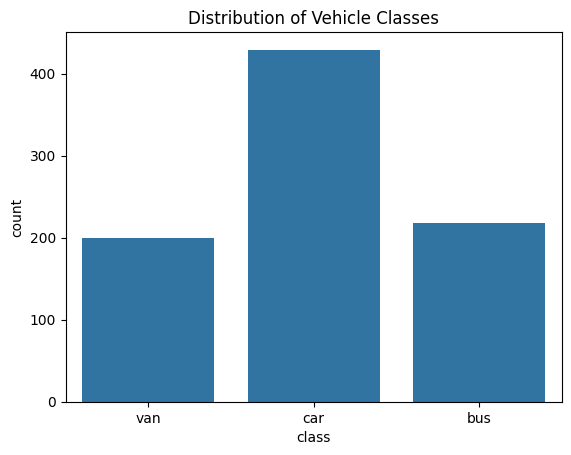

In [10]:
#Distribution of target column ('class')
sns.countplot(x='class', data=df)
plt.title('Distribution of Vehicle Classes')
plt.show()

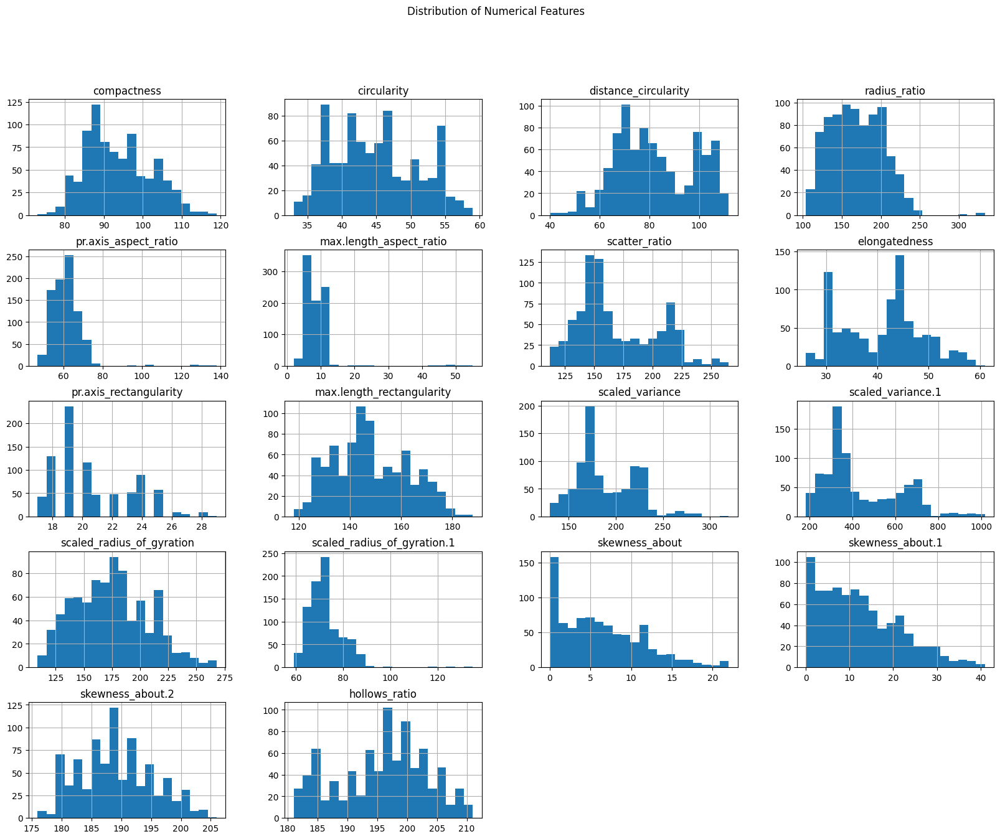

In [11]:
#Distribution of numerical features (histograms)
df.drop(columns='class').hist(bins=20, figsize=(20, 15))  # Exclude target column from histograms
plt.suptitle('Distribution of Numerical Features')
plt.show()

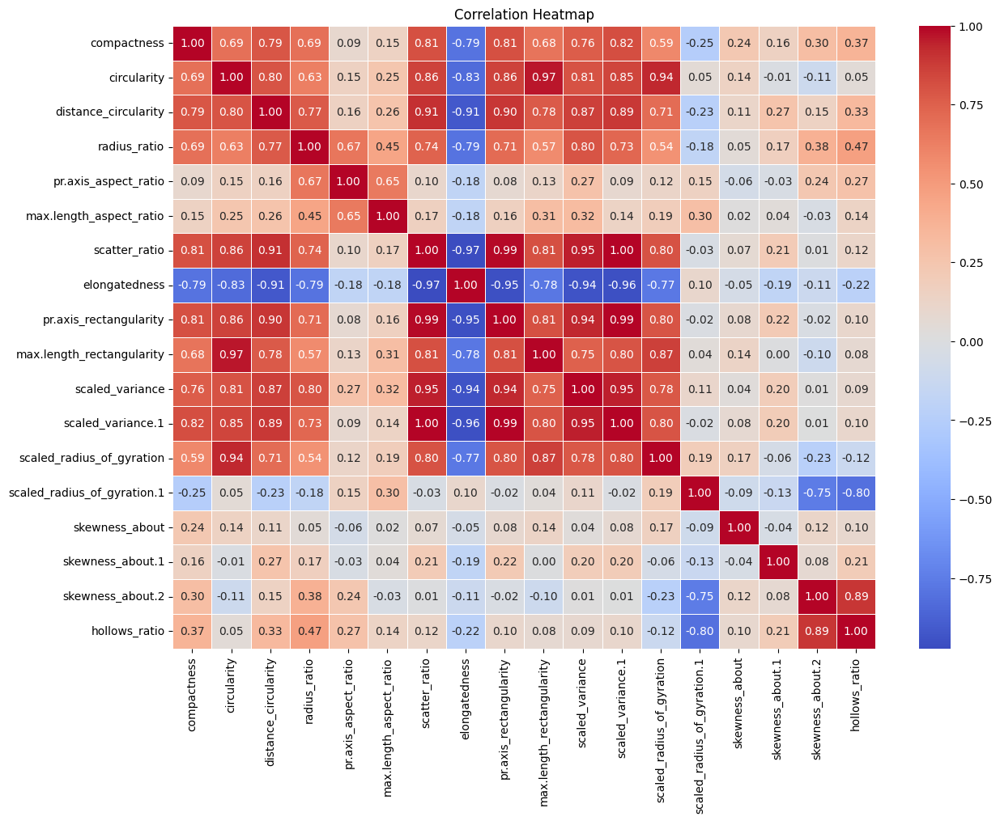

In [12]:
#Correlation heatmap to explore relationships between features
plt.figure(figsize=(14, 10))
sns.heatmap(df.drop(columns='class').corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

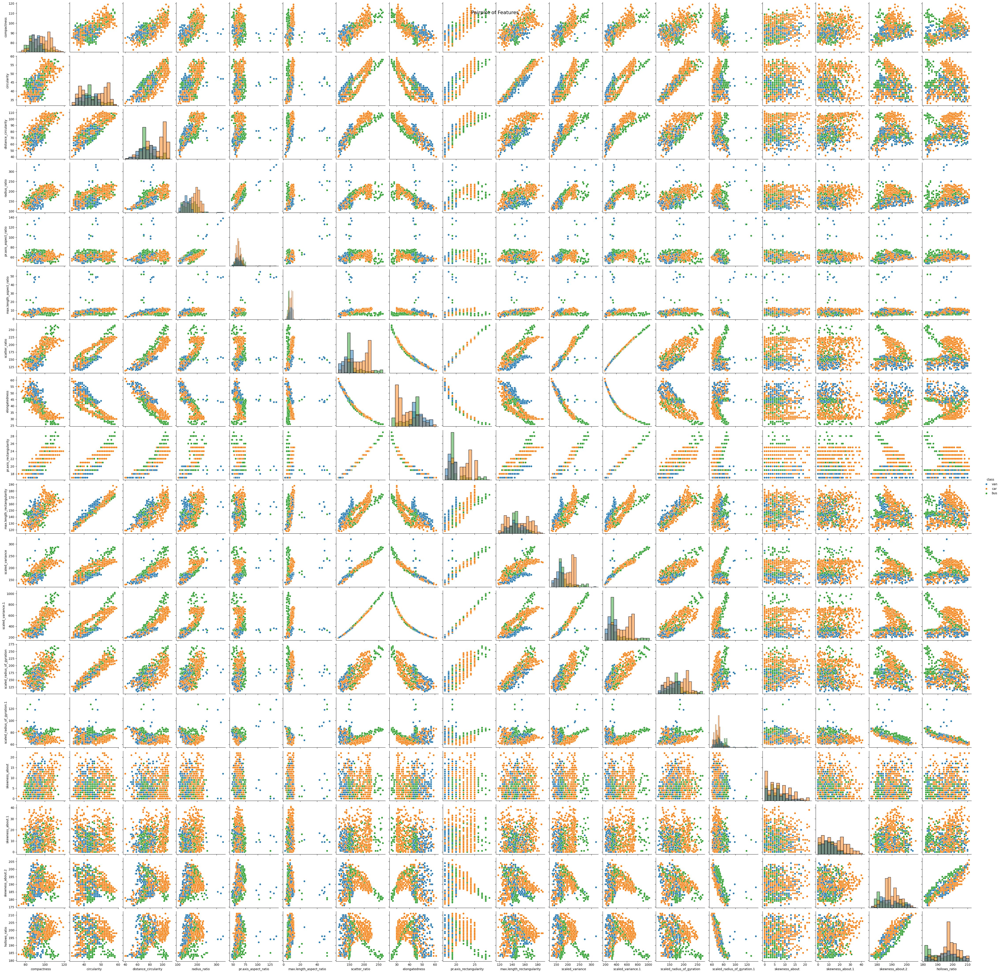

In [13]:
#Pairwise relationships (scatterplot matrix) between features
sns.pairplot(df, hue='class', diag_kind='hist', height=2.5)
plt.suptitle('Pairplot of Features', size=16)
plt.show()

In [14]:
# Check for missing values
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [ ]:
#1.Fill missing values for numerical columns only
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())  # Fill numerical columns with mean

In [ ]:
# 2.Fill missing values in the 'class' column (categorical)
df['class'] = df['class'].fillna(df['class'].mode()[0])  # Fill with the most frequent value


In [ ]:
#3.Check if any missing values remain
print(df.isnull().sum())  # Verify that all missing values have been handled

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64


Explanation for the 3 steps above:
Step 1: We select only the numerical columns and fill their missing values with the mean of each column.
Step 2: For the class column, which is categorical, we fill any missing values with the most frequent value (mode) in that column.
Step 3: We print the count of any remaining null values to confirm everything has been filled properly.

In [20]:
# Check for duplicate rows
print("Number of duplicates in the dataset: ", df.duplicated().sum())

Number of duplicates in the dataset:  0


In [ ]:
# Drop duplicates if any
#df = df.drop_duplicates()

Normalization and Standardization
Standardization: This is important because features might have different scales. Standardization ensures that all features have a mean of 0 and a standard deviation of 1.
Normalization: Normalization might be used depending on the algorithm, but since we are preparing for modeling, standardization is usually the first choice for machine learning models.


In [22]:
from sklearn.preprocessing import StandardScaler

# Separate the features (exclude 'class' column) and the target variable
X = df.drop(columns=['class'])  # Feature columns
y = df['class']  # Target column

# Standardize the feature data (excluding the target column)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [27]:
#You can check the resulting DataFrame
print(df_scaled.head())


   compactness  circularity  distance_circularity  radius_ratio  \
0     0.160580     0.517302              0.056545      0.272965   
1    -0.325470    -0.624564              0.120112     -0.835442   
2     1.254193     0.843549              1.518571      1.201630   
3    -0.082445    -0.624564             -0.007021     -0.296217   
4    -1.054545    -0.135193             -0.769817      1.081803   

   pr.axis_aspect_ratio  max.length_aspect_ratio  scatter_ratio  \
0              1.310206                 0.311542      -0.208038   
1             -0.593962                 0.094079      -0.599893   
2              0.548539                 0.311542       1.148382   
3              0.167705                 0.094079      -0.750606   
4              5.245485                 9.444962      -0.599893   

   elongatedness  pr.axis_rectangularity  max.length_rectangularity  \
0       0.136580               -0.225160                   0.758332   
1       0.520853               -0.611739            

Splitting the Data
You will also need to split the dataset into:

Training set: Used to train the model.
Testing set: Used to test and evaluate the performance of the model.

We will use train_test_split from sklearn to split the data into training and testing sets. Typically, the training set is 70%-80% of the data, and the testing set is 20%-30%.

In [23]:
from sklearn.model_selection import train_test_split

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


Verifying the Data
Check the size of the training and testing sets to ensure everything is split correctly.

In [24]:
print(f"Training set size: {X_train.shape[0]}")
print(f"Testing set size: {X_test.shape[0]}")


Training set size: 676
Testing set size: 170


To check if dimensionality reduction improves performance, we can use Principal Component Analysis (PCA) to reduce the dimensionality of your dataset from 18 features to a lower number while preserving most of the variance in the data. PCA is a popular technique for this purpose.

Step-by-Step Process:

Apply PCA: We'll apply PCA to your scaled data and see how much variance each principal component explains.
Visualize Explained Variance:
 We'll plot the cumulative explained variance to determine how many components are required to preserve most of the variance (typically, we'd aim to preserve around 90% or more of the variance).
Reduce the Dimensions:
 Based on the results, we can decide the number of components to keep.
Compare Model Performance:
 We'll compare model performance before and after PCA to see if it makes a difference.

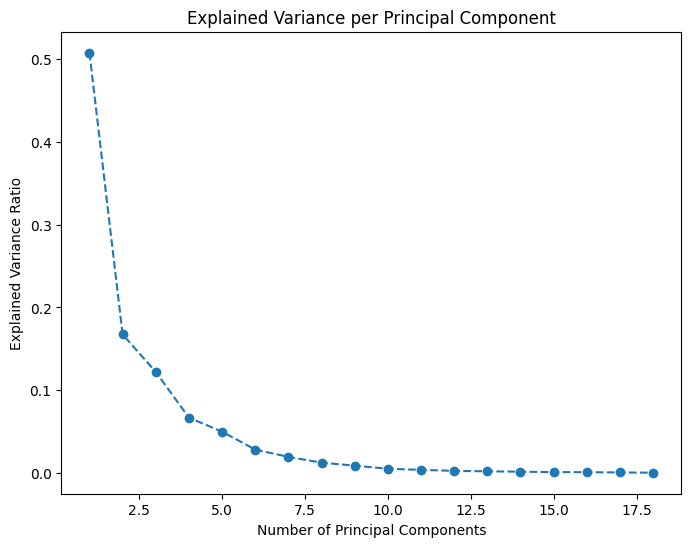

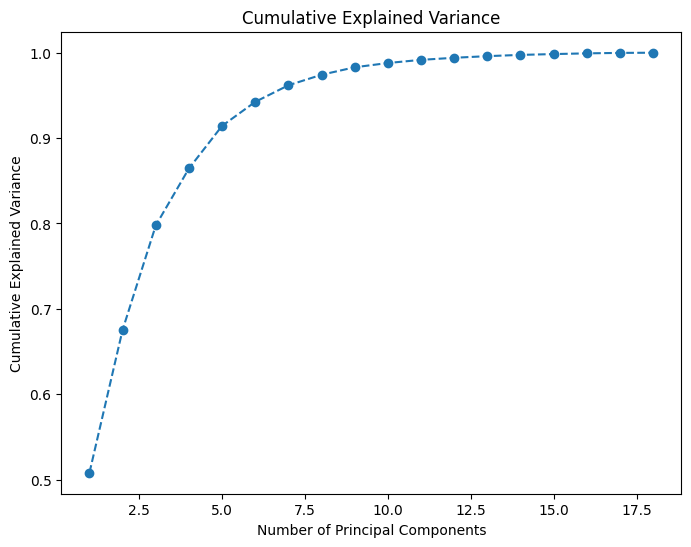

In [28]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Initialize PCA
pca = PCA()

# Fit PCA on the scaled data (features)
pca.fit(X_train)

# Plot the explained variance ratio for each component
explained_variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(8,6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.title('Explained Variance per Principal Component')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.show()

# Plot the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(8,6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()


In [30]:
# Apply PCA with the selected number of components
optimal_components = 6  # You can adjust this based on your cumulative variance plot

pca = PCA(n_components=optimal_components)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Check the new shape of the transformed data
print(f"Original data shape: {X_train.shape}")
print(f"Transformed data shape with PCA: {X_train_pca.shape}")


Original data shape: (676, 18)
Transformed data shape with PCA: (676, 6)


In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Train a Random Forest on the original data
model_original = RandomForestClassifier(random_state=42)
model_original.fit(X_train, y_train)
y_pred_original = model_original.predict(X_test)
accuracy_original = accuracy_score(y_test, y_pred_original)

# Train a Random Forest on the PCA-transformed data
model_pca = RandomForestClassifier(random_state=42)
model_pca.fit(X_train_pca, y_train)
y_pred_pca = model_pca.predict(X_test_pca)
accuracy_pca = accuracy_score(y_test, y_pred_pca)

# Print comparison
print(f"Accuracy on original data: {accuracy_original}")
print(f"Accuracy on PCA-reduced data: {accuracy_pca}")


Accuracy on original data: 0.9764705882352941
Accuracy on PCA-reduced data: 0.9117647058823529


We've successfully reduced the dimensionality of the dataset from 18 features to 6 using PCA, retaining most of the data’s variance. The original accuracy on 18 features was 97.6%, while the accuracy on the PCA-reduced data (6 features) is 91.2%. This reduction improves efficiency and can prevent overfitting while still maintaining reasonable classification performance.

To tackle the classification problem for “Prospect Auto” from both supervised and unsupervised perspectives, we can follow these steps:

1. Supervised Classification Approach:
This involves training a model using the labeled data (with the target variable being the vehicle class: bus, van, car). A popular algorithm to use here could be Logistic Regression, Random Forest, or SVM. We can evaluate the performance based on metrics such as accuracy, precision, recall, f1-score, and confusion matrix.

Steps:
Split the data into training and test sets.
Train a supervised model (e.g., RandomForestClassifier).
Evaluate the model's performance on the test set.
Output relevant metrics (accuracy, confusion matrix, classification report).


In [33]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Separate the features and target column
X = df.drop(columns=['class'])  # Features without 'class'
y = df['class']  # Target column 'class'

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Scale only the features, not the target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Train the RandomForest model
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Print results
print("Supervised Approach:")
print(f"Accuracy: {accuracy}")
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)


Supervised Approach:
Accuracy: 0.9724409448818898
Confusion Matrix:
 [[ 77   1   0]
 [  0 116   2]
 [  0   4  54]]
Classification Report:
               precision    recall  f1-score   support

         bus       1.00      0.99      0.99        78
         car       0.96      0.98      0.97       118
         van       0.96      0.93      0.95        58

    accuracy                           0.97       254
   macro avg       0.97      0.97      0.97       254
weighted avg       0.97      0.97      0.97       254



2.Unsupervised Clustering Approach:
Here, we use clustering algorithms like KMeans or Hierarchical clustering. Since we don't have labels for the clusters, we'll compare how well the unsupervised clustering groups the data and compare the cluster labels to the true vehicle classes using the Adjusted Rand Index (ARI).

Steps:
Apply clustering algorithm like KMeans.
Assign cluster labels and compare with the true labels using ARI.
Output ARI and other relevant metrics.

To visualize the clustering before evaluating the unsupervised approach, we applied PCA to reduce the data to 2D and then used KMeans to cluster the data into three groups (representing the vehicle types). The resulting scatter plot shows the data points in two dimensions, with each cluster represented by a different color. This helps us visually inspect how well KMeans has grouped the data, giving insight into whether the clusters correspond to the different vehicle types. The visualization provides an initial understanding of how the algorithm performs before evaluating with metrics like Adjusted Rand Index (ARI).

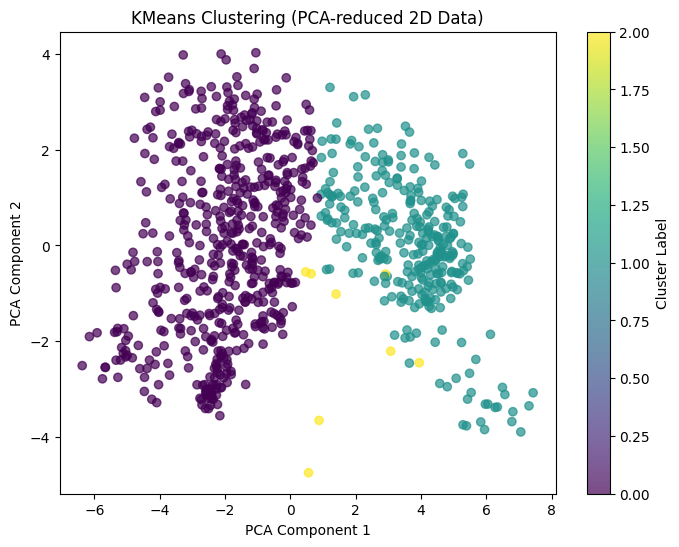

In [34]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Apply PCA to reduce the data to 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X_scaled)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_kmeans, cmap='viridis', alpha=0.7)
plt.title('KMeans Clustering (PCA-reduced 2D Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()


In [42]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X_scaled)

# Evaluate using Adjusted Rand Index
ari = adjusted_rand_score(y, y_kmeans)

# Print ARI result
print("\nUnsupervised Approach:")
print(f"Adjusted Rand Index (ARI): {ari}")



Unsupervised Approach:
Adjusted Rand Index (ARI): 0.070862391095657


Comparison of Approaches:

After evaluating both approaches, here’s the comparison:

Supervised Approach:
    Accuracy: 97.24%
    Confusion Matrix & Classification Report show high precision, recall, and F1-scores across all classes (bus, car, van).
Unsupervised Approach:
    Adjusted Rand Index (ARI): 0.07, indicating a poor match between the clusters and actual vehicle types, as expected from an unsupervised method.
Conclusion:
The supervised approach performs significantly better with higher accuracy and more reliable metrics, as it utilizes labeled data. The unsupervised approach, lacking true labels, yields a much lower ARI, demonstrating the challenge of clustering without labels.